# Task 1: Filters Visualization
## 1.1 - Load VGG16
We are loading a (pretrained) VGG16 via torchvision

In [6]:
import numpy as np
import os
import torch
from torch.optim import Adam
from torchvision import models
from filters_visualization import visualise_layer_filter
from aux_ops import preprocess_image, recreate_image
from collections import OrderedDict
from PIL import Image
import matplotlib.pyplot as plt
from filters_visualization import total_variation_loss

!pip install torchsummary
from torchsummary import summary

%load_ext autoreload
%autoreload 2
# Select the device to work on.
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model = models.vgg16(pretrained=True)
model.to(device)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [2]:
summary(model, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
              ReLU-2         [-1, 64, 224, 224]               0
            Conv2d-3         [-1, 64, 224, 224]          36,928
              ReLU-4         [-1, 64, 224, 224]               0
         MaxPool2d-5         [-1, 64, 112, 112]               0
            Conv2d-6        [-1, 128, 112, 112]          73,856
              ReLU-7        [-1, 128, 112, 112]               0
            Conv2d-8        [-1, 128, 112, 112]         147,584
              ReLU-9        [-1, 128, 112, 112]               0
        MaxPool2d-10          [-1, 128, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]         295,168
             ReLU-12          [-1, 256, 56, 56]               0
           Conv2d-13          [-1, 256, 56, 56]         590,080
             ReLU-14          [-1, 256,

The table above already shows the shape of the activation layers.

## 1.2 - Optimize input image


Since in the second task, there was no actually optimize, I wanted to perform the descriptives of the convolution process by forward hooks, if it is not wrong. The description was too vague, so  I could not decide whether if should I train it or not, but I saw let's optimize phrase in the third task. Hence I wanted to just do a forward hook here for the val of vgg16.

In [3]:
activations = OrderedDict()

def get_activation(name):
    def hook(model, input, output):
        activations[name] = output.detach()
    return hook

for name, layer in model.features.named_children():
    layer.register_forward_hook(get_activation(f'features_{name}'))
for name, layer in model.classifier.named_children():
    layer.register_forward_hook(get_activation(f'classifier_{name}'))

rand_img = np.uint8(np.random.uniform(low=120, high=190, size=(224, 224, 3)))
processed_image = preprocess_image(rand_img, False)
processed_image = torch.tensor(processed_image, device=device).float()
processed_image.requires_grad = True

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)
processed_image = processed_image.to(device)

model.eval()
with torch.no_grad():
    _ = model(processed_image)

for name, activation in activations.items():
    print(f"Layer: {name}")
    print(f"Shape: {activation.shape}")
    print(f"Mean: {activation.mean().item()}")
    print(f"Min: {activation.min().item()}")
    print(f"Max: {activation.max().item()}")


Layer: features_0
Shape: torch.Size([1, 64, 224, 224])
Mean: 0.26640865206718445
Min: 0.0
Max: 4.894179821014404
Layer: features_1
Shape: torch.Size([1, 64, 224, 224])
Mean: 0.26640865206718445
Min: 0.0
Max: 4.894179821014404
Layer: features_2
Shape: torch.Size([1, 64, 224, 224])
Mean: 0.5696592926979065
Min: 0.0
Max: 13.833178520202637
Layer: features_3
Shape: torch.Size([1, 64, 224, 224])
Mean: 0.5696592926979065
Min: 0.0
Max: 13.833178520202637
Layer: features_4
Shape: torch.Size([1, 64, 112, 112])
Mean: 1.2907748222351074
Min: 0.0
Max: 13.833178520202637
Layer: features_5
Shape: torch.Size([1, 128, 112, 112])
Mean: 0.766369104385376
Min: 0.0
Max: 18.03658676147461
Layer: features_6
Shape: torch.Size([1, 128, 112, 112])
Mean: 0.766369104385376
Min: 0.0
Max: 18.03658676147461
Layer: features_7
Shape: torch.Size([1, 128, 112, 112])
Mean: 0.9285053014755249
Min: 0.0
Max: 30.778491973876953
Layer: features_8
Shape: torch.Size([1, 128, 112, 112])
Mean: 0.9285053014755249
Min: 0.0
Max: 30

C:\Users\kutay\AppData\Local\Temp\ipykernel_23376\3078582505.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  processed_image = torch.tensor(processed_image, device=device).float()


As I said, since it was too vague, I wanted to print the trained convolution outputs to check how do the mean, min and max changes through each layer.

In [4]:
visualise_layer_filter(model.features, show=True, filter_nmbr=228, layer_nmbr=28)

c:\Users\kutay\Documents\University\GenAI\Exercise5\filters_visualization.py:35: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  processed_image = torch.tensor(processed_image, device=device).float()


Step 1:
Conv Output Shape: torch.Size([14, 14])
Conv Output Mean: -1.8082917928695679
Conv Output Max: 0.11098523437976837
Conv Output Min: -4.699389934539795
Step 2:
Conv Output Shape: torch.Size([14, 14])
Conv Output Mean: -1.116037130355835
Conv Output Max: 2.89473557472229
Conv Output Min: -3.4264297485351562
Step 3:
Conv Output Shape: torch.Size([14, 14])
Conv Output Mean: 1.3623547554016113
Conv Output Max: 6.949267387390137
Conv Output Min: -2.050130844116211
Step 4:
Conv Output Shape: torch.Size([14, 14])
Conv Output Mean: 4.3774847984313965
Conv Output Max: 13.814665794372559
Conv Output Min: -0.924534261226654
Step 5:
Conv Output Shape: torch.Size([14, 14])
Conv Output Mean: 7.6566009521484375
Conv Output Max: 20.306480407714844
Conv Output Min: 0.5013929009437561
Step 6:
Conv Output Shape: torch.Size([14, 14])
Conv Output Mean: 11.427135467529297
Conv Output Max: 26.907747268676758
Conv Output Min: 1.0161532163619995
Step 7:
Conv Output Shape: torch.Size([14, 14])
Conv Outpu

array([[[168, 237, 130],
        [254, 255,  88],
        [255, 255, 230],
        ...,
        [ 33,  86, 130],
        [131,  67,  42],
        [255, 220,  72]],

       [[ 91, 121,  80],
        [ 72, 113,  44],
        [ 35,  72,  98],
        ...,
        [109, 251, 255],
        [ 28,  86, 209],
        [ 52,   6,  14]],

       [[157, 152, 151],
        [136, 239, 128],
        [177, 246, 195],
        ...,
        [ 86, 102, 253],
        [119, 255, 255],
        [128, 164, 142]],

       ...,

       [[255, 103,  41],
        [255, 149,  56],
        [223,  24, 161],
        ...,
        [ 88, 200,  24],
        [187, 140,  53],
        [248, 227, 131]],

       [[255, 180,  44],
        [255, 151,  76],
        [199,  74, 124],
        ...,
        [ 82,  91,  54],
        [244, 183,  88],
        [255, 117,  16]],

       [[255, 218, 171],
        [255, 231, 113],
        [250, 185, 239],
        ...,
        [ 98,  77,   0],
        [255, 255, 218],
        [229,  52,  21]]

## Task 1.3 - Visualize a random filter.

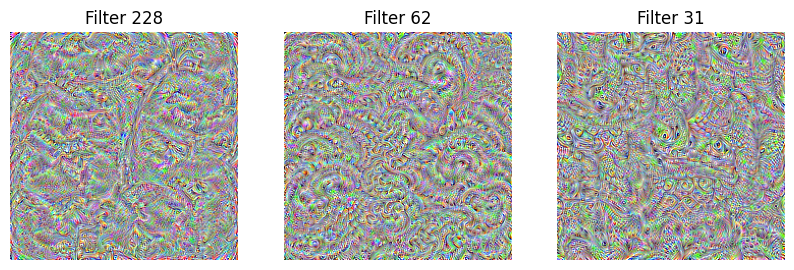

In [5]:
filter_0 = visualise_layer_filter(model=model.features, layer_nmbr=28, filter_nmbr=228, show=False)
filter_1 = visualise_layer_filter(model=model.features, layer_nmbr=28, filter_nmbr=62, show=False)
filter_2 = visualise_layer_filter(model=model.features, layer_nmbr=28, filter_nmbr=31, show=False)

plt.figure(figsize=(10, 4))
plt.subplot(1, 3, 1)
plt.imshow(filter_0)
plt.title('Filter 228')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(filter_1)
plt.title('Filter 62')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(filter_2)
plt.title('Filter 31')
plt.axis('off')

plt.show()


## Task 1.4 - Visualize filters at different layers.

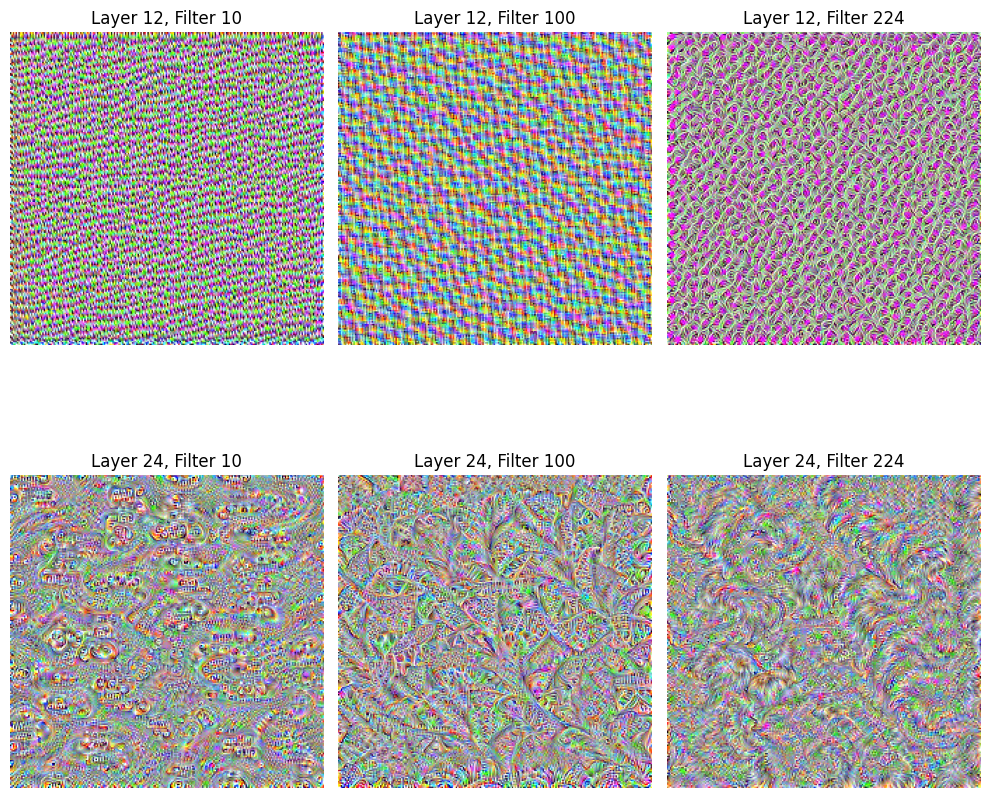

In [6]:
filter_1 = visualise_layer_filter(model=model.features, layer_nmbr=12, filter_nmbr=10, show=False)
filter_2 = visualise_layer_filter(model=model.features, layer_nmbr=12, filter_nmbr=100, show=False)
filter_3 = visualise_layer_filter(model=model.features, layer_nmbr=12, filter_nmbr=224, show=False)

filter_4 = visualise_layer_filter(model=model.features, layer_nmbr=24, filter_nmbr=10, show=False)
filter_5 = visualise_layer_filter(model=model.features, layer_nmbr=24, filter_nmbr=100, show=False)
filter_6 = visualise_layer_filter(model=model.features, layer_nmbr=24, filter_nmbr=224, show=False)


fig, axs = plt.subplots(2, 3, figsize=(10, 10))

axs[0, 0].imshow(filter_1)
axs[0, 0].set_title('Layer 12, Filter 10')
axs[0, 0].axis('off')

axs[0, 1].imshow(filter_2)
axs[0, 1].set_title('Layer 12, Filter 100')
axs[0, 1].axis('off')

axs[0, 2].imshow(filter_3)
axs[0, 2].set_title('Layer 12, Filter 224')
axs[0, 2].axis('off')

axs[1, 0].imshow(filter_4)
axs[1, 0].set_title('Layer 24, Filter 10')
axs[1, 0].axis('off')

axs[1, 1].imshow(filter_5)
axs[1, 1].set_title('Layer 24, Filter 100')
axs[1, 1].axis('off')

axs[1, 2].imshow(filter_6)
axs[1, 2].set_title('Layer 24, Filter 224')
axs[1, 2].axis('off')

plt.tight_layout()
plt.show()

As the layer gets bigger, it starts to capture more patterns, especially nonlinear ones. Plus it starts to capture larger patterns. Furthermore, as we increase the number of layers, it is beneficial for us to increase the filter size.

These can be explained via couple things

Earlier layers tend to capture simple patterns such as edges and textures, whereas later layers capture more complex and abstract features. This is because later layers build upon the features learned in earlier layers, gradually forming more sophisticated representations of the input data.

Later layers are more capable of capturing nonlinear patterns. This is because deeper layers typically involve more complex transformations and combinations of features.

With the increase in layer depth, the receptive fields of neurons also increase. Neurons in deeper layers have access to information from a larger spatial area of the input image, enabling them to capture larger and more global patterns or structures in the data.

## Task 1.5 - Hyperparameter tuning.


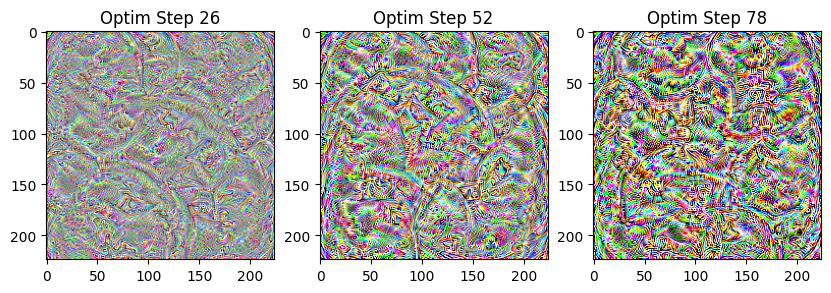

In [7]:
filter_0 = visualise_layer_filter(model=model.features, layer_nmbr=28, filter_nmbr=228, show=False)
filter_1 = visualise_layer_filter(model=model.features, layer_nmbr=28, filter_nmbr=228, show=False, num_optim_steps=52)
filter_2 = visualise_layer_filter(model=model.features, layer_nmbr=28, filter_nmbr=228, show=False, num_optim_steps=78)

plt.figure(figsize=(10, 4))

plt.subplot(1, 3, 1)
plt.imshow(filter_0)
plt.title('Optim Step 26')

plt.subplot(1, 3, 2)
plt.imshow(filter_1)
plt.title('Optim Step 52')

plt.subplot(1, 3, 3)
plt.imshow(filter_2)
plt.title('Optim Step 78')

plt.show()

As the number of optimization steps increases, the lines in the visualization become sharper, the patterns become more distinct, and the color differences become more pronounced. We can see that the model is sensetive to the hyperparameter number of optimization steps.  Adjusting this parameter can significantly affect the clarity and detail of the resulting visualization. Also as we go deeper, it gets more noisy, and it distorts the data more and more.

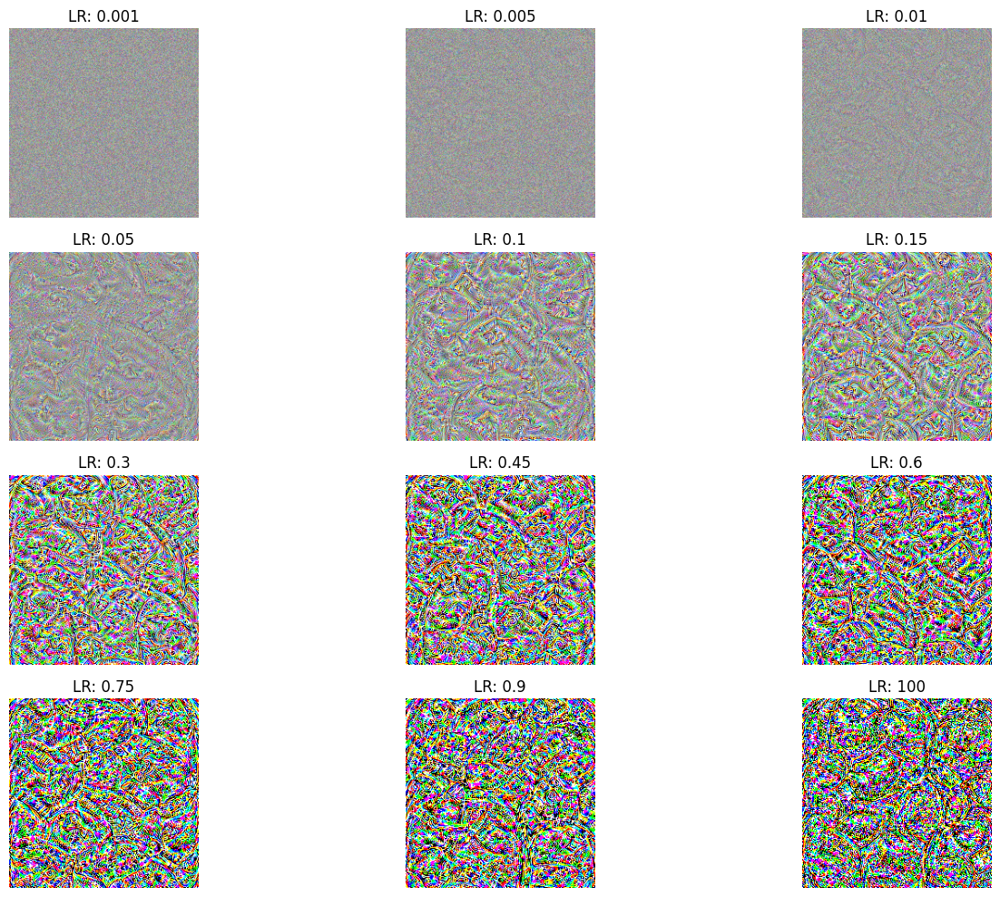

In [8]:
learning_rates = [0.001,0.005, 0.01, 0.05, 0.1, 0.15, 0.3, 0.45, 0.6, 0.75, 0.9, 100]
filters = []
for lr in learning_rates:
    filters.append(visualise_layer_filter(model=model.features, layer_nmbr=28, filter_nmbr=228, show=False, lr=lr))

fig, axes = plt.subplots(4, 3, figsize=(15, 10))
axes = axes.flatten()

for i, ax in enumerate(axes):
    ax.imshow(filters[i])
    ax.set_title(f'LR: {learning_rates[i]}')
    ax.axis('off')

plt.tight_layout()
plt.show()

At lower learning rates, the optimization process is slow and gradual, resulting in less defined and blurrier patterns. This is because the small step sizes in the optimization algorithm do not allow significant changes in the filter weights, leading to less pronounced features.

As the learning rate increases to moderate values (e.g., 0.01, 0.1, 0.3), the patterns in the filters become clearer and more distinct. The optimization process is more effective at these rates, allowing the model to adjust the weights sufficiently to reveal more detailed and sharp features.

However, as we continue to increase the learning rate further, the colors become more distinct, but the amount of black clusters also increases, which can be interpreted as noise. This indicates that very high learning rates can cause the optimization process to overshoot optimal values, introducing artifacts and reducing the overall quality of the filter visualization.

In summary, while moderate learning rates improve the clarity and distinction of patterns, very high learning rates can lead to increased noise and less reliable visualizations.

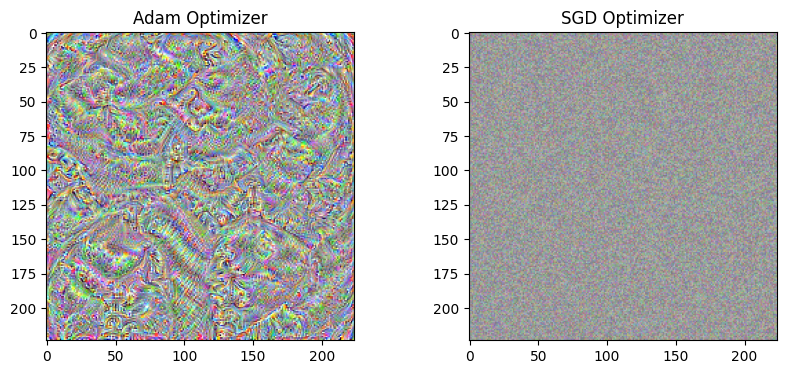

In [9]:
filter_0 = visualise_layer_filter(model=model.features, layer_nmbr=28, filter_nmbr=228, show=False)
filter_1 = visualise_layer_filter(model=model.features, layer_nmbr=28, filter_nmbr=228, show=False, optimizer= torch.optim.SGD)


plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.imshow(filter_0)
plt.title('Adam Optimizer')

plt.subplot(1, 2, 2)
plt.imshow(filter_1)
plt.title('SGD Optimizer')

plt.show()

When keeping the other parameters the same, we can observe the difference between the SGD and Adam optimizers. Adam combines the benefits of both momentum and RMSprop, allowing it to converge more quickly and securely. In contrast, SGD does not use these techniques and therefore requires more steps to converge to the optimal solution. Consequently, the Adam optimizer often reaches the optimum faster than SGD, which still needs additional steps to achieve convergence.

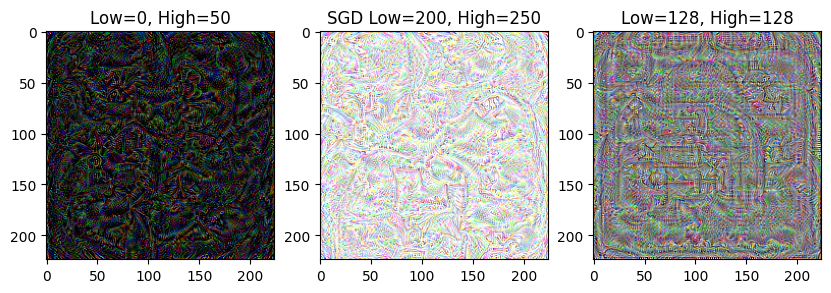

In [10]:
filter_0 = visualise_layer_filter(model=model.features, layer_nmbr=28, filter_nmbr=228, show=False, low=0, high=50)
filter_1 = visualise_layer_filter(model=model.features, layer_nmbr=28, filter_nmbr=228, show=False, low=200, high=250)
filter_3 = visualise_layer_filter(model=model.features, layer_nmbr=28, filter_nmbr=228, show=False, low=128, high=128)

plt.figure(figsize=(10, 4))

plt.subplot(1, 3, 1)
plt.imshow(filter_0)
plt.title('Low=0, High=50')

plt.subplot(1, 3, 2)
plt.imshow(filter_1)
plt.title('SGD Low=200, High=250')

plt.subplot(1, 3, 3)
plt.imshow(filter_3)
plt.title('Low=128, High=128')


plt.show()

When the input image is initialized with lower values, closer to 0, the resulting patterns tend to be darker.
When initialized with higher values, closer to 255, the patterns appear lighter.
Initializing the image with a constant value of 128 (the midpoint) can provide a balanced starting point, potentially leading to a more neutral representation where patterns neither start too dark nor too light.

## Task 1.6 - Pretrained weights.


c:\Users\kutay\miniconda3\envs\deepl\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


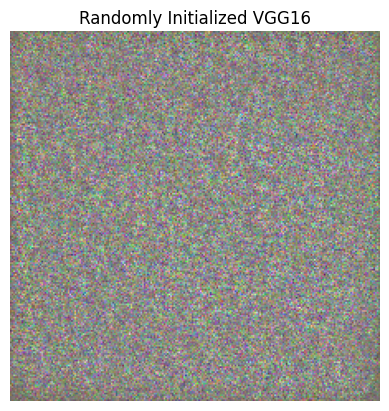

In [11]:
model = models.vgg16(pretrained=False)
model.to(device)
filter_0 = visualise_layer_filter(model=model.features, layer_nmbr=28, filter_nmbr=228, show=False)

plt.imshow(filter_0)
plt.title('Randomly Initialized VGG16')
plt.axis('off')
plt.show()

I see random noise. Since the pretrained is false, there are no positions, or colors, or shapes that model is aware of. Hence it predicts the random noise.

# Task 2: Deep Dream

## Task 1.1 Most activated filters for every image

# Here is a thing about the terminology. In the task it is been stated that we need to visualize the filters, but visualizing the 3x3 filters a.k.a. kernels, looks like below, which did not make any sense to me. Hence, I decided to divide the 2.1 and 2.2 into two parts. Where I illustrate the filters, as the first one, and second, where I illustrate the activations. Since the interpretation of the 3x3 kernels does not make any sense I will interpret the activations.

c:\Users\kutay\miniconda3\envs\deepl\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\kutay\miniconda3\envs\deepl\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


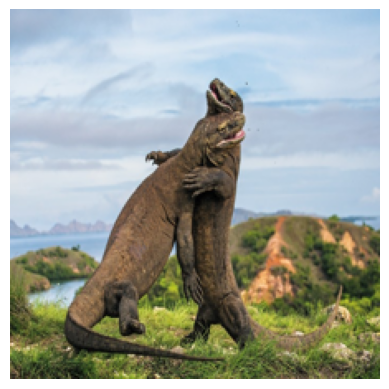

C:\Users\kutay\AppData\Local\Temp\ipykernel_8568\2087691451.py:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  processed_image = torch.tensor(processed_image, device=device).float()


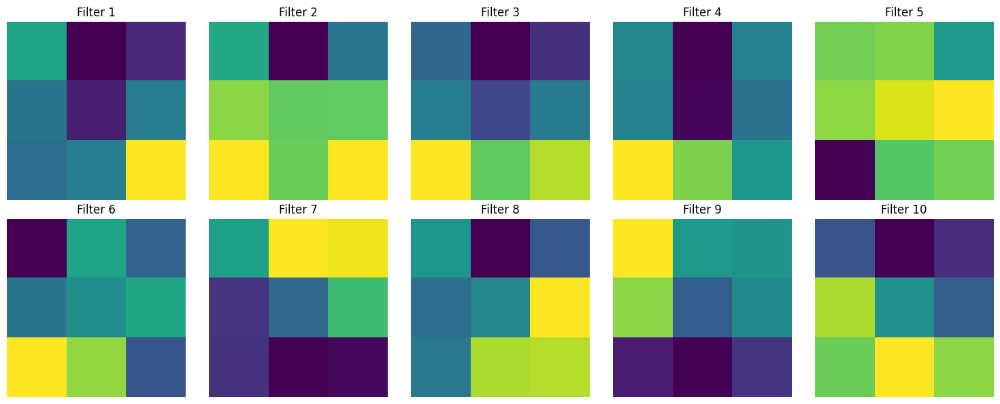

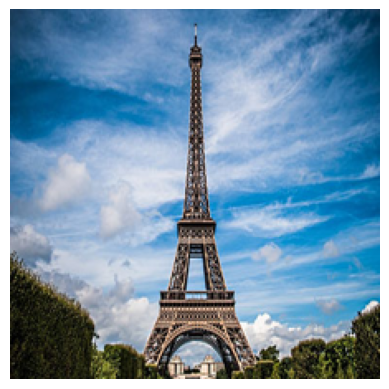

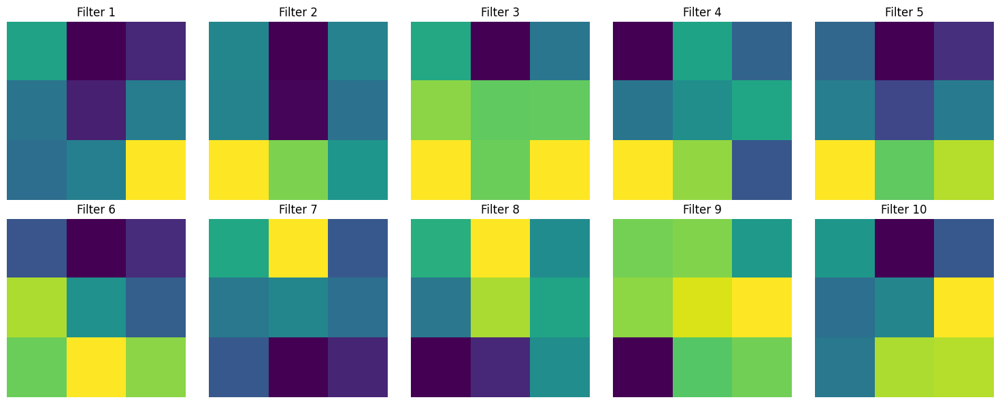

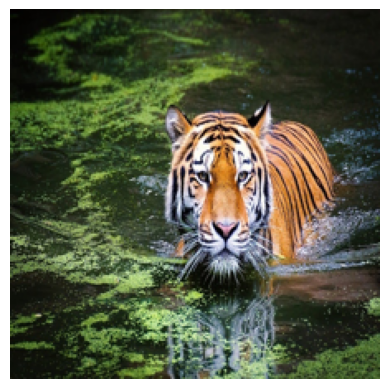

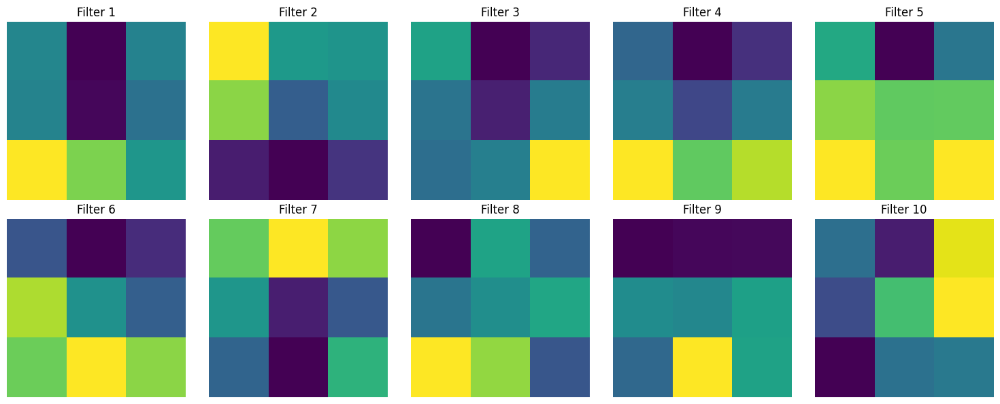

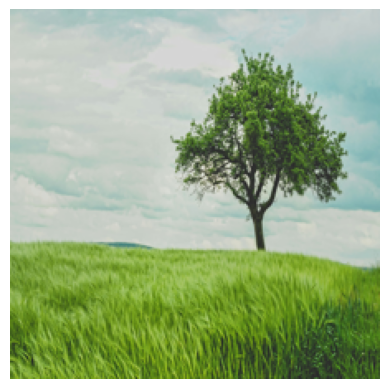

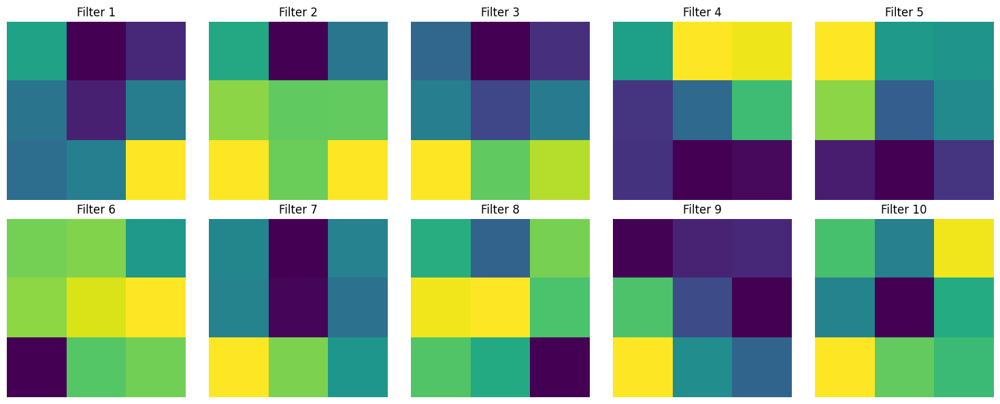

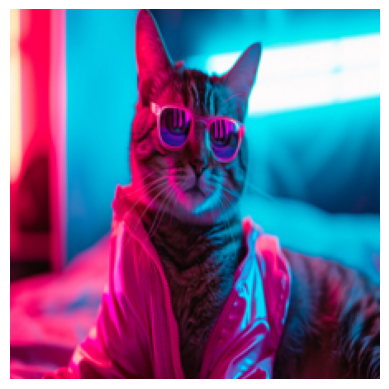

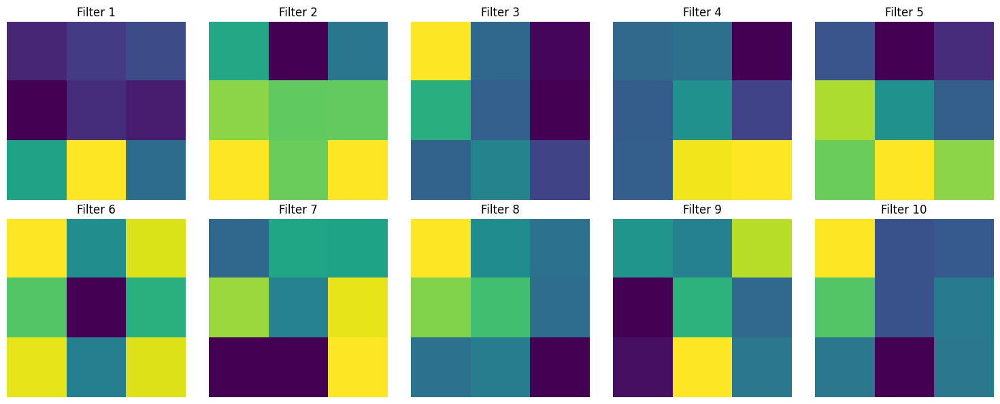

In [15]:
model = models.vgg16(pretrained=True)
model.to(device)

def transTensor(tensor, ch=0, allkernels=False, nrow=8, padding=1): 
        n,c,w,h = tensor.shape

        if allkernels: tensor = tensor.view(n*c, -1, w, h)
        elif c != 3: tensor = tensor[:,ch,:,:].unsqueeze(dim=1)

        return tensor

def visualize_most_activated_filters(image_dir, model, device, total_var_loss = False):
        rand_img = np.array(Image.open(image_dir).resize((224, 224)))
        plt.imshow(rand_img)
        plt.axis('off')
        plt.show()

        processed_image = preprocess_image(rand_img, False)
        processed_image = torch.tensor(processed_image, device=device).float()
        processed_image.requires_grad = True

        optimizer = torch.optim.Adam([processed_image], lr=0.01, weight_decay=1e-5)

        for i in range(1, 26):
                optimizer.zero_grad()
                x = processed_image
                for index, layer in enumerate(model.features):
                        x = layer(x)
                        if index == 13:
                                filter = model.features[index+1].weight.data.clone()
                                break
        
                conv_output = x[0]
                if total_var_loss:
                        loss = -torch.mean(conv_output) + total_variation_loss(processed_image)
                else:
                        loss = -torch.mean(conv_output)
                loss.backward()
                optimizer.step()
        
        activation_values = torch.mean(conv_output, dim=(1, 2))
        top_filters_indices = torch.argsort(activation_values, descending=True)[:10]
        filters = transTensor(filter[top_filters_indices])
        fig, axes = plt.subplots(2, 5, figsize=(15, 6))
        axes = axes.flatten()
   
        for i, ax in enumerate(axes):
                filter = filters[i].cpu().detach().numpy().squeeze()
                ax.imshow(filter, cmap='viridis')
                ax.axis('off')
                ax.set_title(f'Filter {i+1}')

        plt.tight_layout()
        plt.show()


image_list = os.listdir('random_images')
for image in image_list:
    visualize_most_activated_filters(f'random_images/{image}', model, device)

## Task 1.2 Total variation loss.

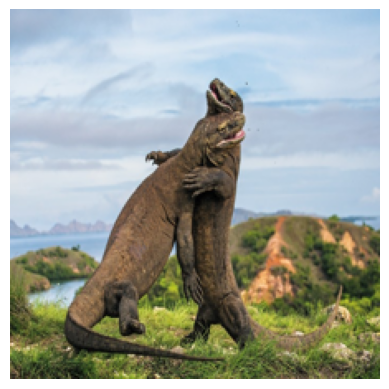

C:\Users\kutay\AppData\Local\Temp\ipykernel_8568\2087691451.py:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  processed_image = torch.tensor(processed_image, device=device).float()


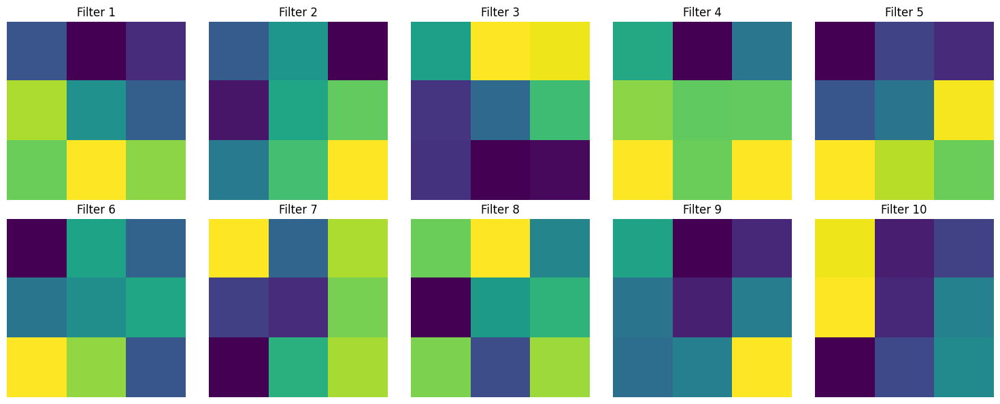

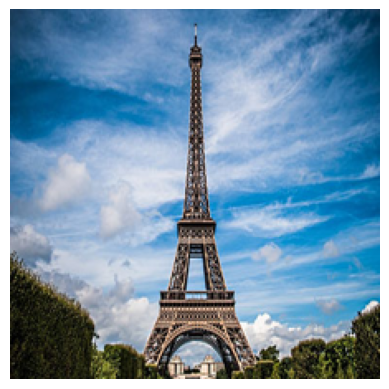

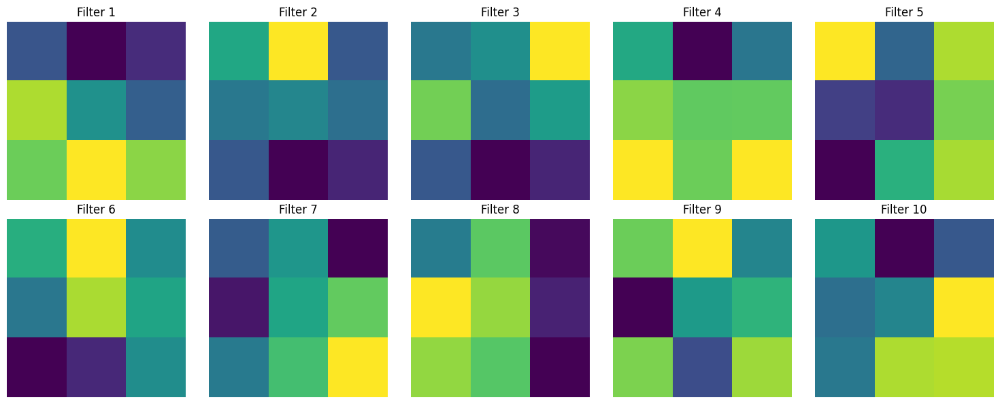

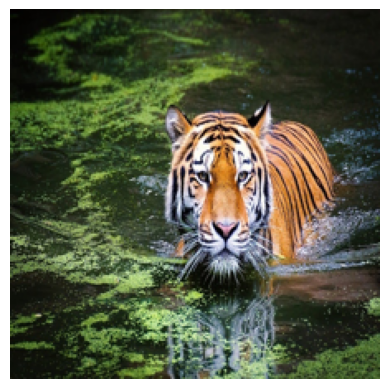

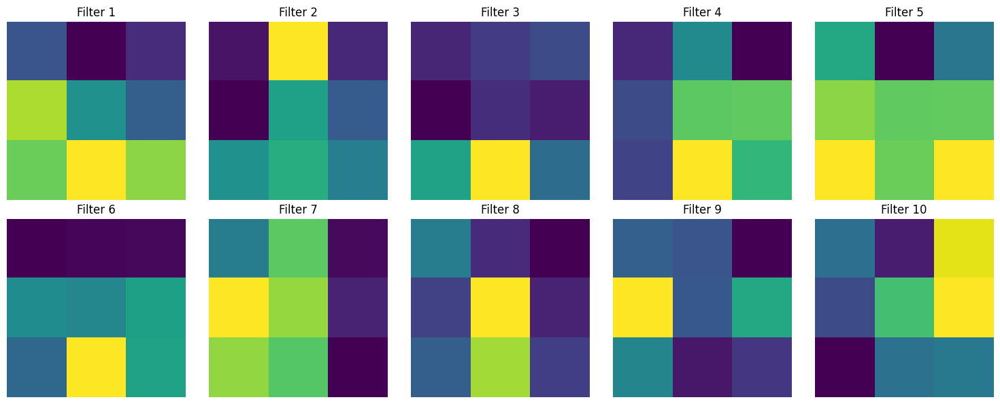

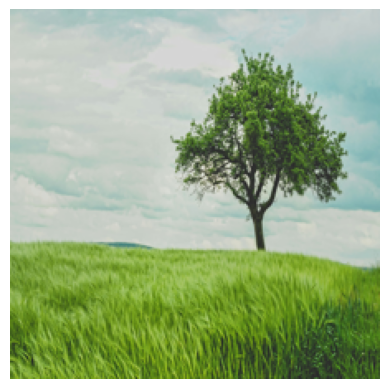

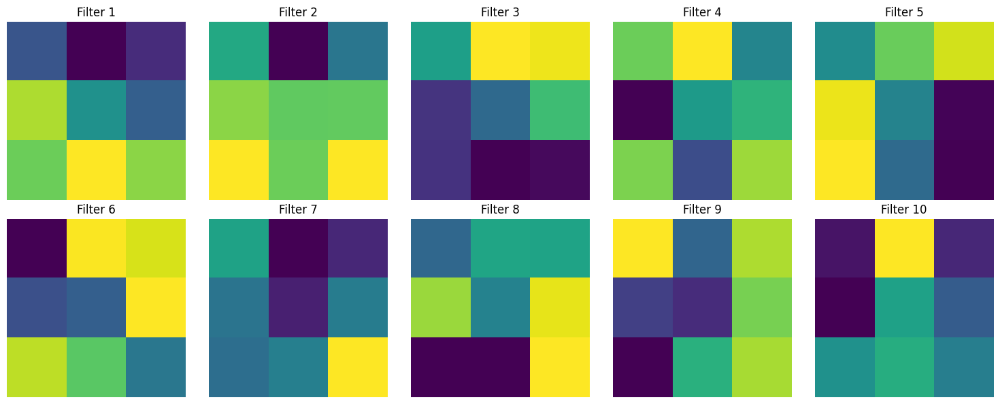

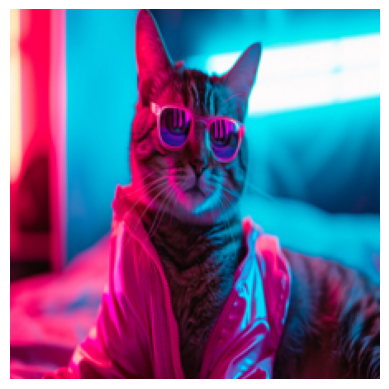

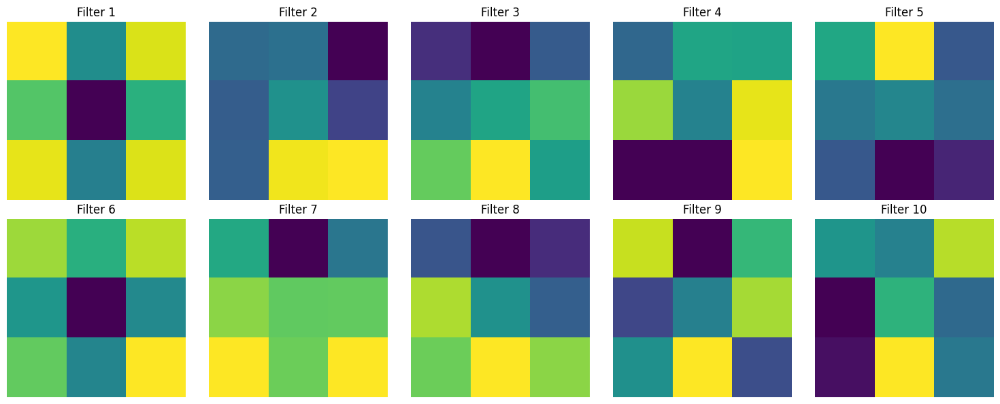

In [16]:
for image in image_list:
    visualize_most_activated_filters(f'random_images/{image}', model, device, total_var_loss=True)

# 2.1.2


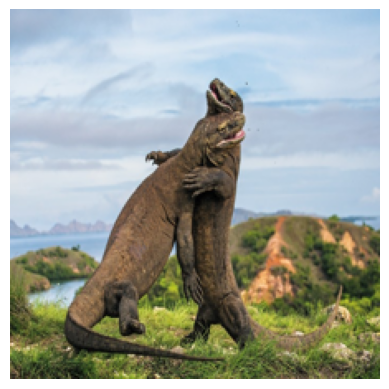

C:\Users\kutay\AppData\Local\Temp\ipykernel_23376\1743920323.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  processed_image = torch.tensor(processed_image, device=device).float()


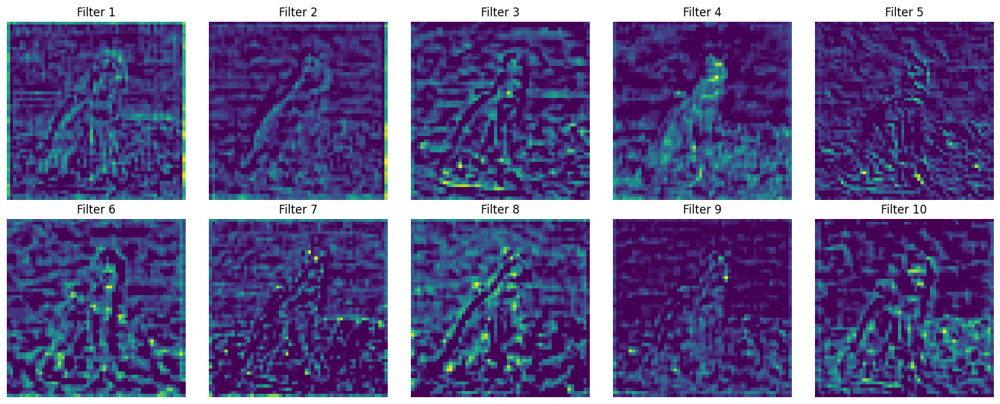

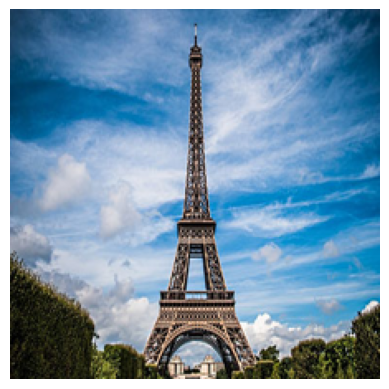

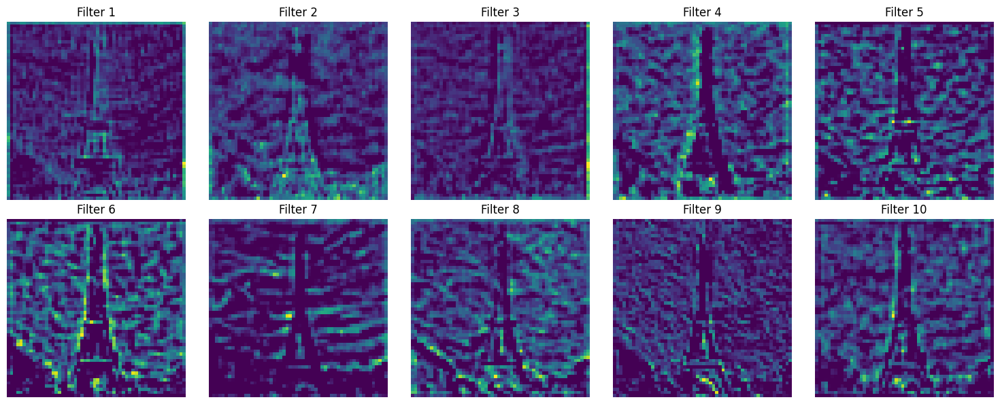

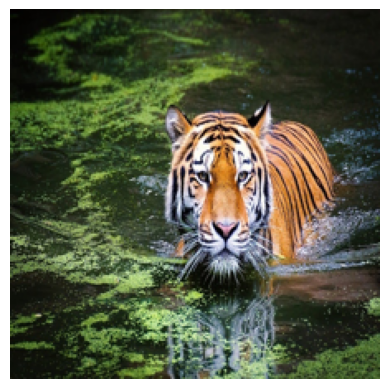

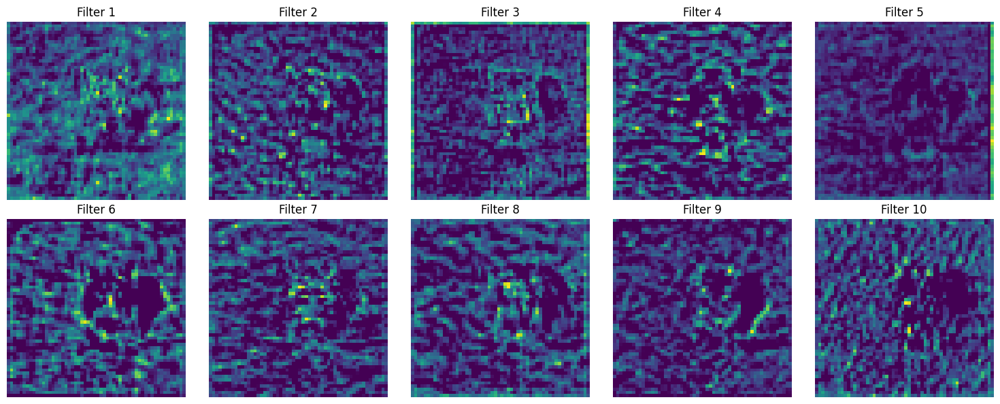

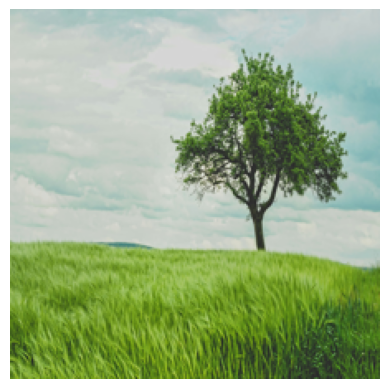

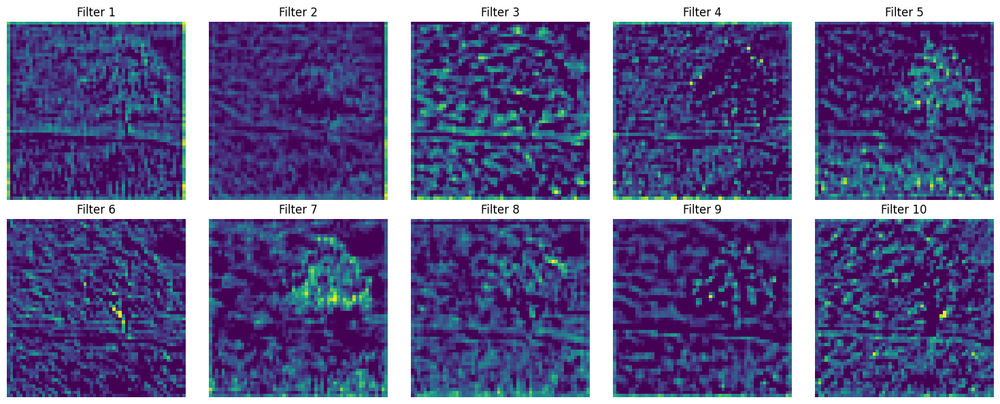

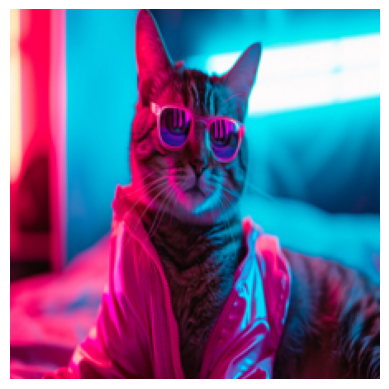

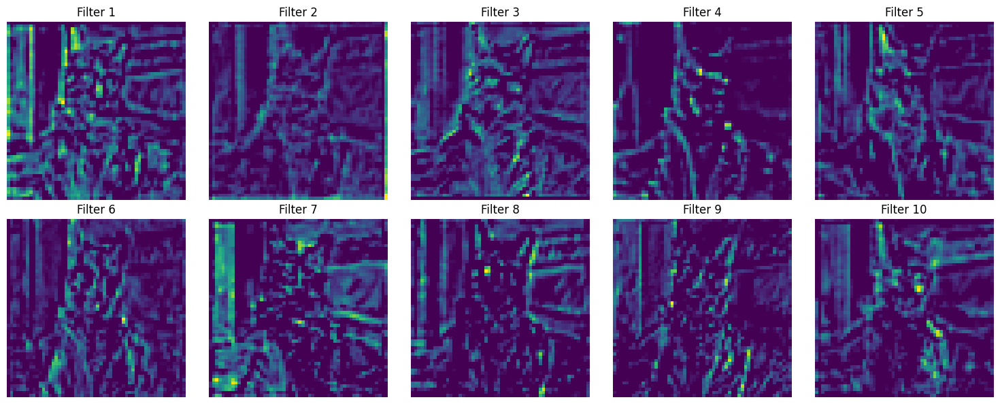

In [14]:
model = models.vgg16(pretrained=True)
model.to(device)

def visualize_most_activated_filters(image_dir, model, device, total_var_loss = False):
        rand_img = np.array(Image.open(image_dir).resize((224, 224)))
        plt.imshow(rand_img)
        plt.axis('off')
        plt.show()

        processed_image = preprocess_image(rand_img, False)
        processed_image = torch.tensor(processed_image, device=device).float()
        processed_image.requires_grad = True

        optimizer = torch.optim.Adam([processed_image], lr=0.01, weight_decay=1e-5)

        for i in range(1, 26):
                optimizer.zero_grad()
                x = processed_image
                for index, layer in enumerate(model.features):
                        x = layer(x)
                        if index == 13:
                                filter = model.features[index+1].weight.data.clone()
                                break
                        
                        
                conv_output = x[0]
                if total_var_loss:
                        loss = -torch.mean(conv_output) + total_variation_loss(processed_image)
                else:
                        loss = -torch.mean(conv_output)
                loss.backward()
                optimizer.step()
        
        activation_values = torch.mean(conv_output, dim=(1, 2))
        top_filters_indices = torch.argsort(activation_values, descending=True)[:10]
        fig, axes = plt.subplots(2, 5, figsize=(15, 6))
        axes = axes.flatten()
        
        for i, ax in enumerate(axes):
                filter_index = top_filters_indices[i].item()
                filter_activation = conv_output[filter_index].cpu().detach().numpy()
                ax.imshow(filter_activation, cmap='viridis')
                ax.axis('off')
                ax.set_title(f'Filter {i+1}')

        plt.tight_layout()
        plt.show()


image_list = os.listdir('random_images')
for image in image_list:
    visualize_most_activated_filters(f'random_images/{image}', model, device)

I see the most activated filters through these images, however they are a little bit distorted. Hence, too reduce the noise, let's look at the Total variation loss version.

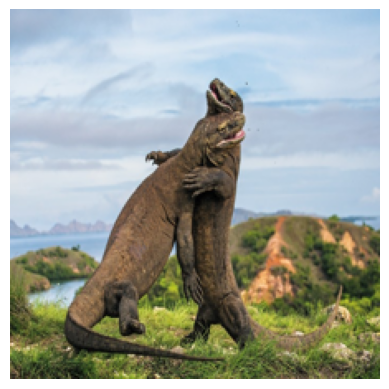

C:\Users\kutay\AppData\Local\Temp\ipykernel_23376\1743920323.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  processed_image = torch.tensor(processed_image, device=device).float()


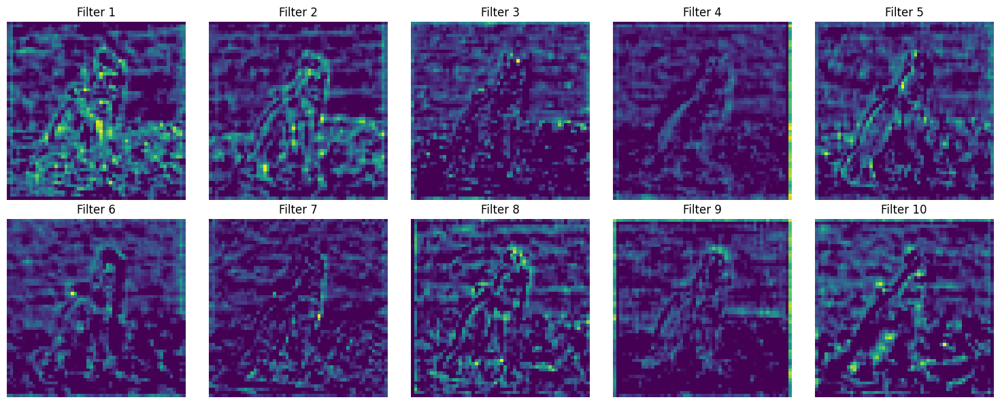

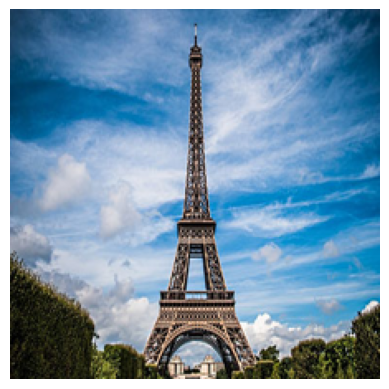

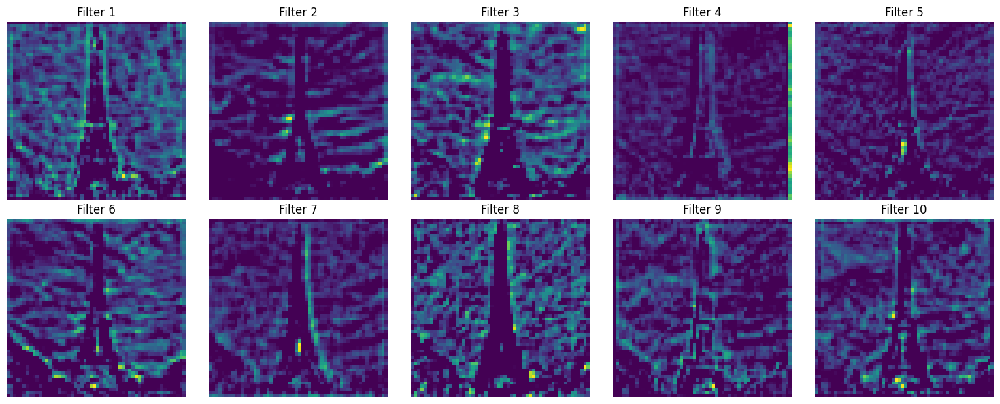

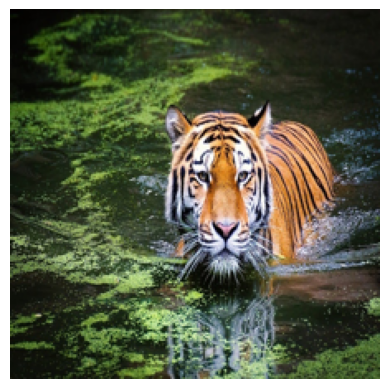

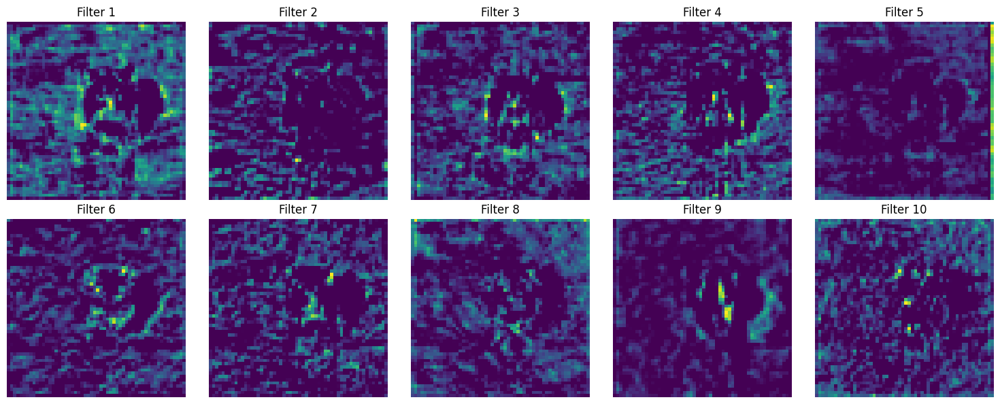

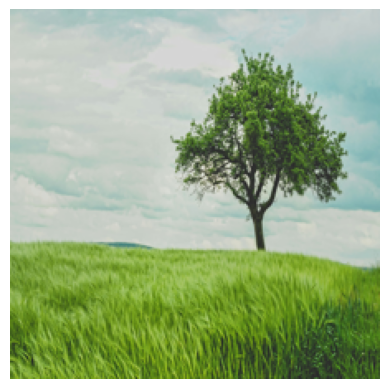

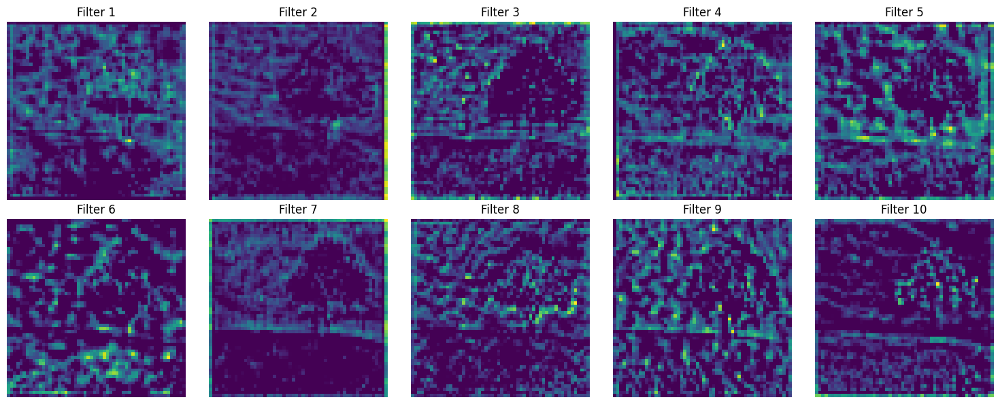

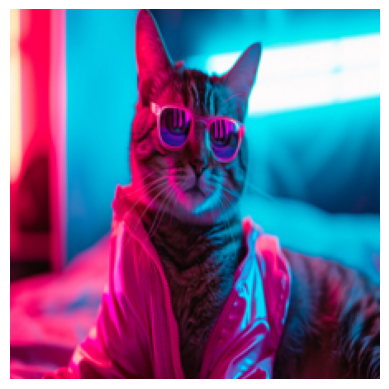

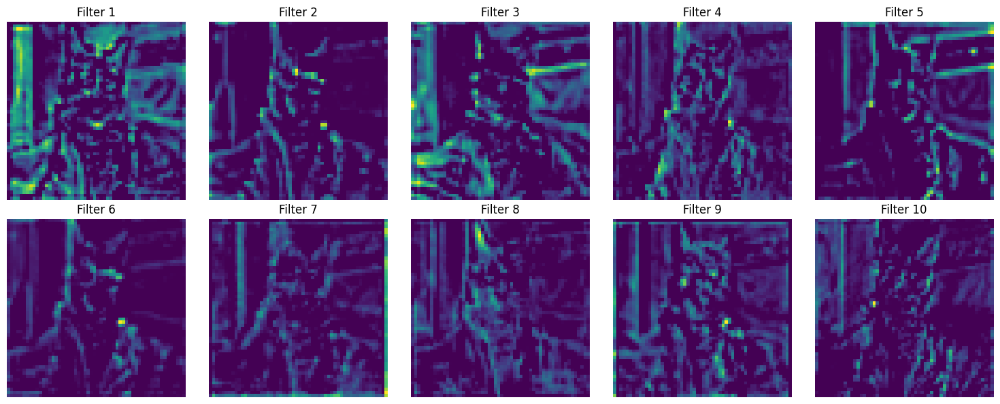

In [15]:
for image in image_list:
    visualize_most_activated_filters(f'random_images/{image}', model, device, True)

With the weight of 0.001 in Total variation loss, we can see that the noise is less, the pictures are clearer.

## Task 1.3 Deep dream.

C:\Users\kutay\AppData\Local\Temp\ipykernel_23376\2889775394.py:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  processed_image = torch.tensor(processed_image, device=device).float()


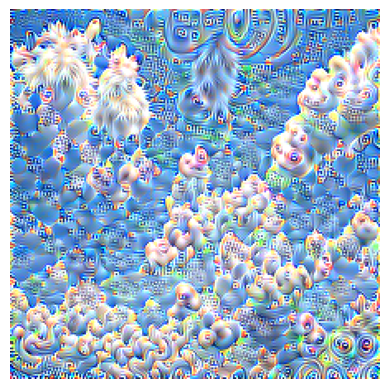

In [16]:
def deepdream(image_dir, model, device, num_iterations=31, lr=0.01, total_var_loss=True, layers_to_use=None):
    img = np.array(Image.open(image_dir).resize((224, 224)))
    processed_image = preprocess_image(img, False)
    processed_image = torch.tensor(processed_image, device=device).float()
    processed_image.requires_grad = True

    optimizer = Adam([processed_image], lr=lr)
    model.to(device)
    model.eval()
    
    if layers_to_use is None:
        layers_to_use = [layer for layer in model.features._modules.keys()]
    
    for i in range(num_iterations):
        optimizer.zero_grad()
        x = processed_image
        activations = []
        for name, layer in model.features._modules.items():
            x = layer(x)
            if name in layers_to_use:
                activations.append(x)

        loss = 0
        for activation in activations:
            loss -= torch.norm(activation) ** 2


        if total_var_loss:
            loss += total_variation_loss(processed_image)

        loss.backward()
        optimizer.step()

    img = recreate_image(processed_image.cpu())
    plt.imshow(img)
    plt.axis('off')
    plt.show()

deepdream(f'real_image/clouds.jpg', model, device, num_iterations=300
          , lr=0.005, total_var_loss=True, layers_to_use=['10', '19', '28'])
    

I have tried different layers, learning rates, and num iterations. As the lr and num_iterations gets higher, the image becomes noisier, and we start to lose the patterns, and we have random noise like pixels. If we increase the num_iterations we need to dampen the learning rate, and vica versa, to find the sweet spot where the algorithm produces something nice.

Also in the layers, as we go deeper, the patterns become more distinguishable and larger.